# Cálculo de engranes helicoidales

In [73]:
import numpy as np
from tabulate import tabulate

#### Conversión de unidades

In [74]:
def inch_to_mm(value):
    return value * 25.4

def mm_to_inch(value):
    return value / 25.4

def rad_to_deg(value):
    return value * (180 / np.pi)

def deg_to_rad(value):
    return value * (np.pi / 180)

def rpm_to_radps(value):
    return value * (2 * np.pi / 60)

def radps_to_rpm(value):
    return value * (60 / (2 * np.pi))

def celsius_to_fahrenheit(celsius):
    return (celsius * 9/5) + 32

def fahrenheit_to_celsius(fahrenheit):
    return (fahrenheit - 32) * 5/9

def hp_to_watt(hp):
    return hp * 745.7

def psi_a_mpa(psi):
    return psi * 0.00689476

## Parámetros geométricos de los engranes rectos

### 1) Cálculo de la longitud de acción

$$ Z = \sqrt{(r_g + a_g)^2 - (r_g \cos(\phi))^2 } + \sqrt{(r_p + a_p)^2 - (r_p \cos(\phi))^2 } - (r_g + r_p) \sin(\phi)$$

In [75]:
def longitud_accion(r_g, a_g, r_p, a_p, phi):
    """
    Cálculo de la longitud de acción entre dos engranajes.
    
    Parámetros:
    r_g: Radio de paso del engranaje
    a_g: Addendum engranaje
    r_p: Radio de paso del piñón
    a_p: Addendum piñón
    phi: Ángulo de presión en grados
    
    Retorna:
    Longitud de acción
    """
    return np.sqrt( ((r_g + a_g) ** 2) - ((r_g * np.cos(deg_to_rad(phi))) ** 2) ) + \
           np.sqrt(((r_p + a_p) ** 2) - ((r_p * np.cos(deg_to_rad(phi))) ** 2) ) - \
           (r_g + r_p) * np.sin(deg_to_rad(phi))

### 2) Nomenclatura de los engranes

- $\psi$: Ángulo de la hélice
- $\phi_n$: Ángulo de presión normal
- $\phi_t$: Ángulo de presión transversal. $\tan(\phi_t) = \frac{\tan(\phi_n)}{\cos(\psi)}$
- $p_n$: Paso circular normal
- $p_t$: Paso circular transversal. $p_t = \frac{p_n}{\cos(\psi)}$
- $p_x$: Paso axial. $p_x = \frac{p_n}{\sin(\psi)}$
- $p_d$: Paso diametral. $p_d = \frac{N}{d}$.
- $m$: Módulo. $m = \frac{1}{p_d}$. 
- $p_{nd}$: Paso diametral normal. $p_{nd} = \frac{p_d}{\cos(\psi)}$
- $m_{nd}$: Módulo normal. $m_{nd} = \frac{1}{p_{nd}}$
- $m_p$: Razón de contacto transversal. $m_p = \frac{Z}{p_b}$
- $m_F$: Razón de contacto axial. $m_F = \frac{F}{p_x}$
- $N'$: Número virtual de dientes. $N' = \frac{N}{\cos^3(\psi)}$

In [76]:
# Ángulos
def angulo_presion_transversal(phi_n, psi):
    """
    Recibe:
    phi_n: Ángulo de presión normal en grados
    psi: Ángulo de la hélice en grados
    
    Retorna:
    phi_t: Ángulo de presión transversal"""
    return rad_to_deg(np.arctan(np.tan(deg_to_rad(phi_n)) / np.cos(deg_to_rad(psi))))

def angulo_presion_normal(phi_t, psi):
    """
    Recibe:
    phi_t: Ángulo de presión transversal en grados
    psi: Ángulo de la hélice en grados
    
    Retorna:
    phi_n: Ángulo de presión normal en grados"""
    return rad_to_deg(np.arctan(np.tan(deg_to_rad(phi_t)) * np.cos(deg_to_rad(psi))))

# Pasos
def paso_transversal(p_n, psi):
    """
    Recibe:
    p_n: Paso diametral normal
    psi: Ángulo de la hélice
    
    Retorna:
    p_t: Paso circular transversal"""
    return p_n / np.cos(deg_to_rad(psi))

def paso_axial(p_n, psi):
    """
    Recibe:
    p_n: Paso diametral normal
    psi_ Ángulo de la hélice.
    
    Retorna:
    p_x: Paso axial"""
    return p_n / np.sin(deg_to_rad(psi))

def paso_diametral(N, d):
    """
    Recibe:
    N: Número de dientes
    d: Diámetro de paso (in)
    
    Retorna:
    p_d: Paso diametral (in^-1)"""
    return N / d

def modulo(p_d):
    """
    Recibe:
    p_d: Paso diametral
    
    Retorna:
    m: Módulo"""
    return inch_to_mm(1 / p_d)

def paso_diametral_normal(p_d, psi):
    """
    Recibe:
    p_d: paso diametral
    psi: Ángulo de la hélice
    
    Retorna:
    p_nd: Paso diametral normal"""
    return p_d / np.cos(deg_to_rad(psi))

def modulo_normal(p_nd):
    """
    Recibe:
    p_nd: Paso diametral normal
    
    Retorna:
    m_nd: Módulo normal"""
    return inch_to_mm(1 / p_nd)

# Razones de contacto
def razon_contacto_transversal(Z, p_t, psi):
    """
    Recibe:
    Z: Longitud de acción
    p_t: Paso transversal
    psi: Ángulo de la hélice
    
    Retorna:
    m_p: Razón de contacto transversal"""
    return Z / (p_t * np.cos(deg_to_rad(psi)))

def razon_contacto_axial(F, p_x):
    """
    Recibe:
    F: Ancho de cara
    p_x: Paso axial
    
    Retorna:
    m_F: Razón de contacto axial"""
    return F / p_x

# Número virtual de dientes
def N_virtual(N, psi):
    """Número virtual de dientes"""
    return N / (np.cos(deg_to_rad(psi)) ** 3)

### 5) Dientes estándar para engranes helicoidales:

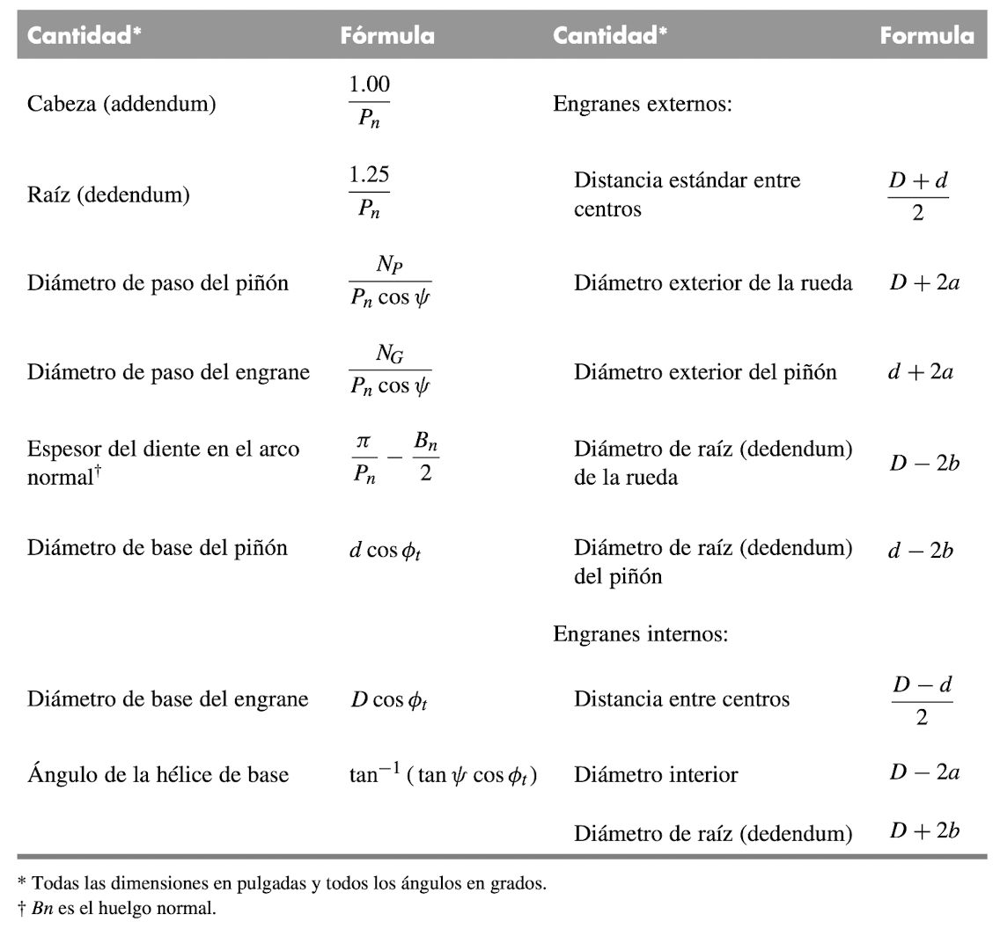
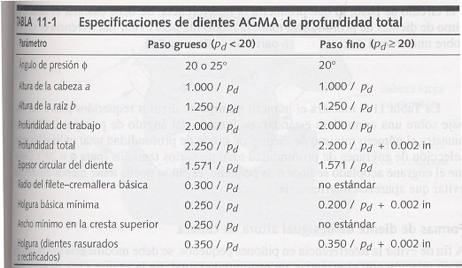

In [77]:
def parametros_modulo_normal(m_n):
    """
    Recibe:
    m_n: Módulo normal en mm
    
    Retorna:
    a: Addendum en mm
    b: Deddendum en mm"""

    p_nd = 1 / mm_to_inch(m_n)


    a = inch_to_mm(1.000 / p_nd)
    b = inch_to_mm(1.250 / p_nd)

    return a, b

def diametro_paso(N_dientes, m_n, psi):
    """
    Recibe:
    N_dientes: Número de dientes del engrane o piñón
    m_n: Módulo normal
    psi: Ángulo de la hélice

    Retorna:
    d: Diámetro de paso del engrane o piñón
    """
    return N_dientes * m_n / (np.cos(deg_to_rad(psi)))

def diametro_base(d, phi_t):
    """
    Recibe:
    d: Diámetro de paso del engrane o piñón
    phi_t: Ángulo de presión transversal

    Retorna:
    d: Diámetro de base del engrane o piñón
    """
    return d * np.cos(deg_to_rad(phi_t))


### 6) Chequear interferencia entre engranes

Para que un engranaje no sufra interferencia, tanto el piñón como el engrane deben cumplir la siguiente condición:

$$ d_b - d_{raiz} < 0.5 \cdot a$$

In [78]:
def chequear_interferencia(d_paso, d_base, m_n):

    """
    Recibe:
    d: Diámetro de paso en mm
    m: Módulo en mm
    phi: Ángulo de presión en grados
    
    Retorna:
    Mensaje diciendo si hay interferencia o no"""
    a, b = parametros_modulo_normal(m_n)
    d_raiz = d_paso - (2 * b)

    if (d_base - d_raiz) < (0.5 * a):
        # print(f"No hay interferencia 😁")
        return "No hay interferencia ✅"

    else:
        # print(f"Hay interferenica ‼️")
        return "Hay interferencia ❌"

### 7) Chequear la razón de contacto:

Para engranes helicoidales, la condición de diseño es:

$$ m_f > 1.15 \; \& \; 1.4 < m_p < 2$$

In [79]:
def chequear_razon_contacto(m_f, m_p):

    """
    Recibe:
    m_f: Razón de contacto axial
    m_p: Razón de contacto transversal

    Retorna:
    Mensaje si la razón de contacto está entre los límites establecidos
    """
    
    if m_f > 1.15 and (1.4 < m_p and 2 > m_p):
        # print(f"Se cumple la razón de contacto 😁")
        return f"Se cumple la razón de contacto ✅ con m_f = {m_f:.2f} y m_p = {m_p:.2f}"
    else:
        return f"No se cumple la razón de contacto ❌. m_f = {m_f:.2f} y m_p = {m_p:.2f}"

### Número mínimo de dientes

$$ 
N_{min} = \frac{2k \cos \psi}{(1 + 2 m_G) \sin ^2 \phi_t}(m_G + \sqrt{m_G^2 + (1 + 2m_G) \sin^2 \phi_t})
$$
Donde $k = 1$ para dientes de profundidad completa y $m_G$ es el módulo del engrane

In [80]:
def numero_minimo_dientes(psi, m, phi):
    first_term = (2 * np.cos(deg_to_rad(psi)) / ((1 + 2*m) * (np.sin(deg_to_rad(phi)) ** 2)))
    second_term = m + np.sqrt((m ** 2) + ((1 + 2*m) * (np.sin(deg_to_rad(phi)) ** 2)))
    return first_term * second_term

N_min = numero_minimo_dientes(psi=20, phi=25, m=3)
print(f"El número mínimo de dientes es: {N_min}")

El número mínimo de dientes es: 9.32234160706737


## Parámetros de resistencia del engrane

### Fuerzas radial, tangencial y total

- $W_t$: Fuerza Tangencial. $W_t = \frac{2T}{d}$
- $W_r$: Fuerza Radial. $W_r = W_t \cdot \tan(\phi_t)$
- $W_a$: Fuerza Axial. $W_a = W_t \cdot \tan(\psi)$
- $W$: Fuerza Total. $W = \frac{W_t}{\cos(\phi_n) \cdot \cos(\psi)}$

In [81]:
def fuerza_tangencial(T, d):
    """
    Recibe:
    T: Torque que experimenta el diente (medido en Nm)
    d: Diámetro de paso en mm
    
    Retorna:
    Wt: Fuerza tangencial en N"""

    return (2 * T) / (d * 1e-3)

def fuerza_radial(T, d, phi_t):
    """
    Recibe:
    T: Torque que experimenta el diente (medido en Nm)
    d: Diámetro de paso en mm
    phi_t: Ángulo de presión transversal en grados
    
    Retorna:
    Wr: Fuerza radial en N"""
    return fuerza_tangencial(T, d) * np.tan(deg_to_rad(phi_t))

def fuerza_axial(T, d, psi):
    """
    Recibe:
    T: Torque que experimenta el diente (medido en Nm)
    d: Diámetro de paso en mm
    psi: Ángulo de la hélice en grados
    
    Retorna:
    Wa: Fuerza axial en N"""
    return fuerza_tangencial(T, d) * np.tan(deg_to_rad(psi))

def fuerza_total(T, d, phi_n,psi):
    """
    Recibe:
    T: Torque que experimenta el diente (medido en Nm)
    d: Diámetro de paso en mm
    phi_n: Ángulo de presión normal en grados
    psi: Ángulo de la hélice en grados
    
    Retorna:
    Wa: Fuerza axial en N"""
    return fuerza_tangencial(T, d) / (np.cos(deg_to_rad(phi_n)) * np.cos(deg_to_rad(psi)) )

### Esfuerzo por flexión:

$$ \sigma = \frac{W_t}{FmJ} \frac{K_a K_m}{K_v} K_s K_B K_I $$

Donde:



- $\sigma$: Esfuerzo por flexión ($MPa$)
- $W_t$: Fuerza tangencial transimitda ($N$)
- $F$: Ancho de la cara del diente ($mm$)
- $m$: **Módulo métrico transversal** ($mm$)
- $J$: Factor geométrico de flexión
- $K_a$: Factor de aplicación
- $K_m$: Factor de distribución de carga
- $K_v$: Factor dinámico
- $K_s$: Factor de tamaño
- $K_B$: Factor de espesor del aro
- $K_I$: Factor de engrane intermedio


In [82]:
def sigma_flexion(Wt, F, m, J, Ka, Km, Kv, Ks, Kb, Ki):
    return (Wt / (F * m * J)) * (Ka * Km / Kv) * (Ks * Kb * Ki)

#### $J$: Factor geométrico

Cambia con respecto a los engranes rectos. Depende del ángulo de la hélice $\psi$ y del ángulo de presión transversal $\phi_t$

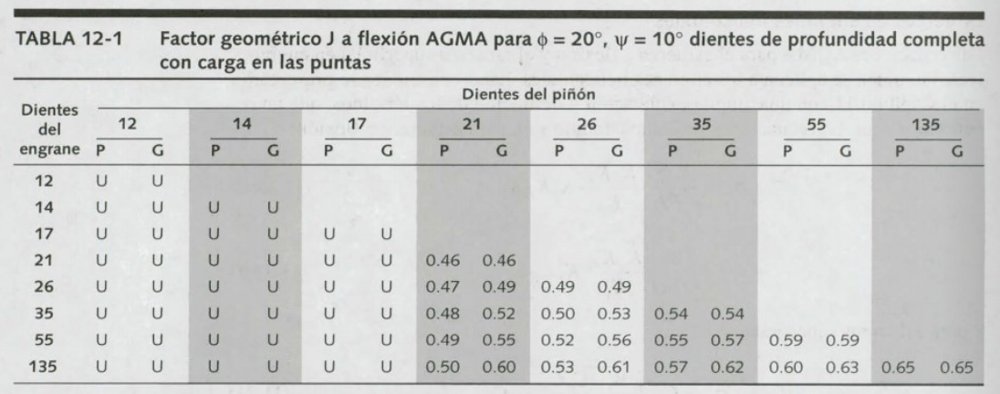 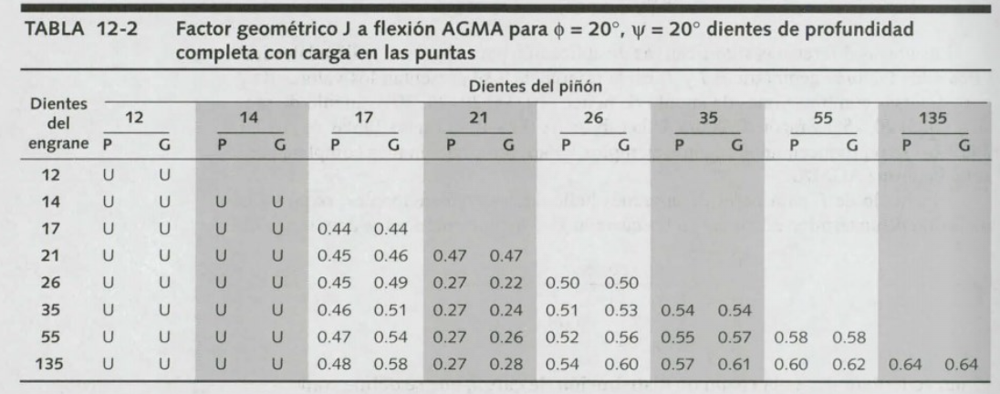 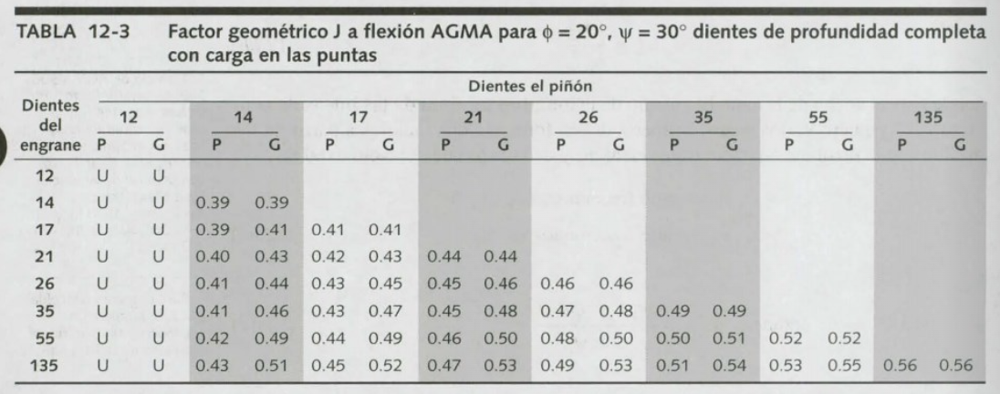 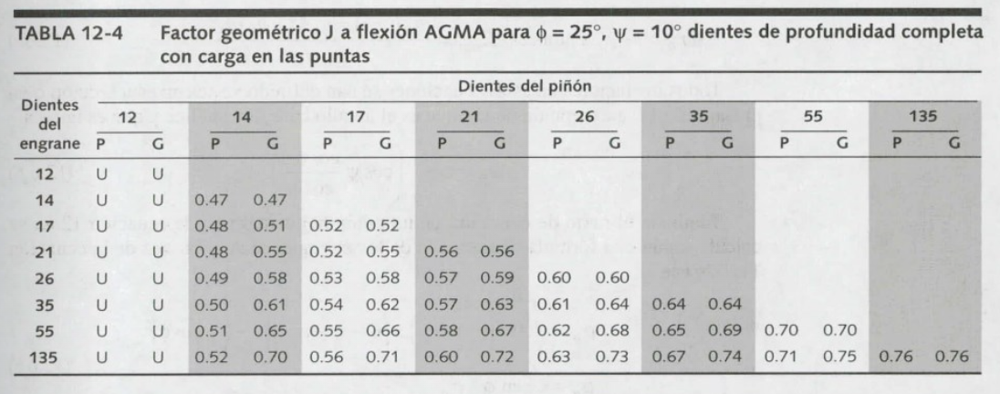 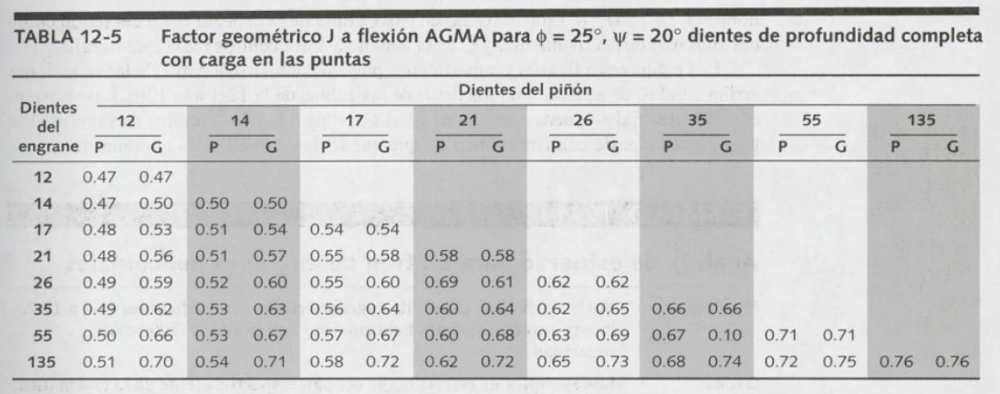 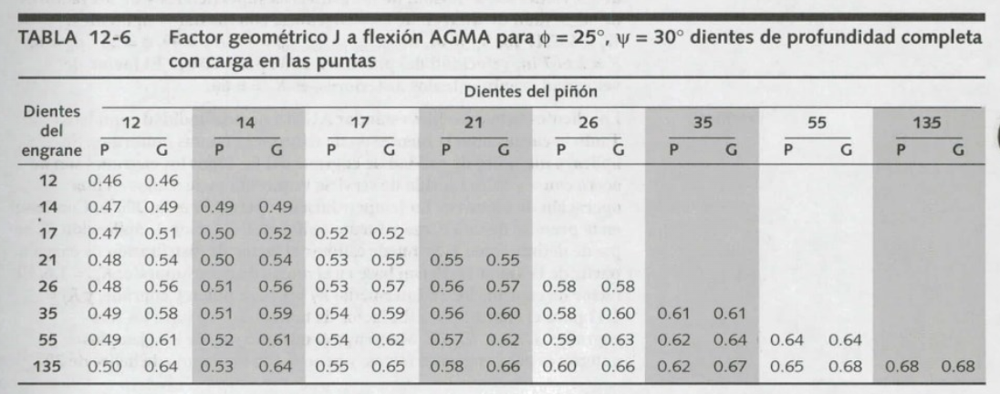

In [83]:
J_g = 0.561 # Factor geométrico engrane (Tabla 12.2)
J_p = 0.547 # Factor geométrico piñón (Tabla 12.2)

#### $K_a$: Factor de aplicación

- $K_a = 1$ en equipos con funcionamiento suave (ventilador, cinta, trasportadora, escalera mecánica)
- $K_a = 2$ en equipos con cargas intermedias (grúa, ascensor, bomba, reciprocante)
- $K_a = 3$ en equipos con cargas de aplicación violenta (chancadora, guillotina) 

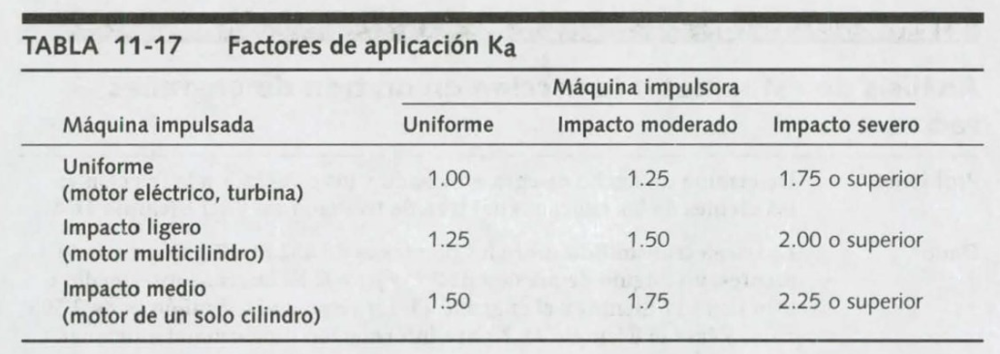

In [84]:
def k_a(tipo_carga):
    if tipo_carga == "suave":
        return 1
    elif tipo_carga == "intermedia":
        return 2
    elif tipo_carga == "violenta":
        return 3
    
Ka_g = 3 # Factor de aplicación engrane (guillotina)
Ka_p = 3 # Factor de aplicación piñón (guillotina)

#### $K_m$ Factor de distribución de carga

| Ancho de cara (mm) | Factor de distribución de carga $K_m$ |
| :-: | :-: |
| < 50 | 1.5 |
| 150 | 1.6 |
| 225 | 1.7 |
| 400 > | 2.0 |

In [85]:
Km_g = 1.5 # Factor de distribución de carga engrane (mt = 4.31 mm)
Km_p = 1.5 # Factor de distribución de carga piñón (mt = 4.31 mm)

#### $K_v$: Factor dinámico

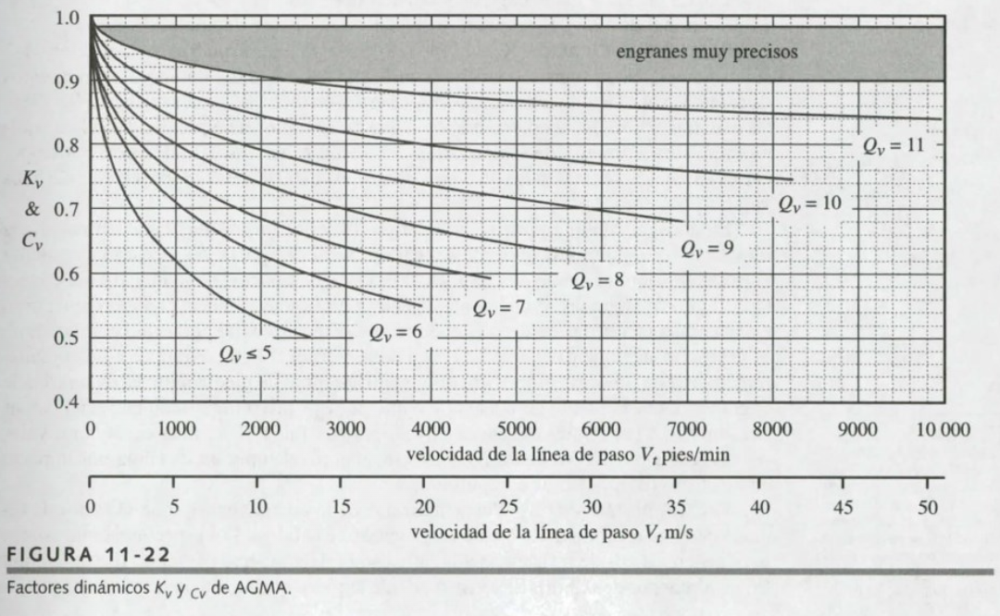
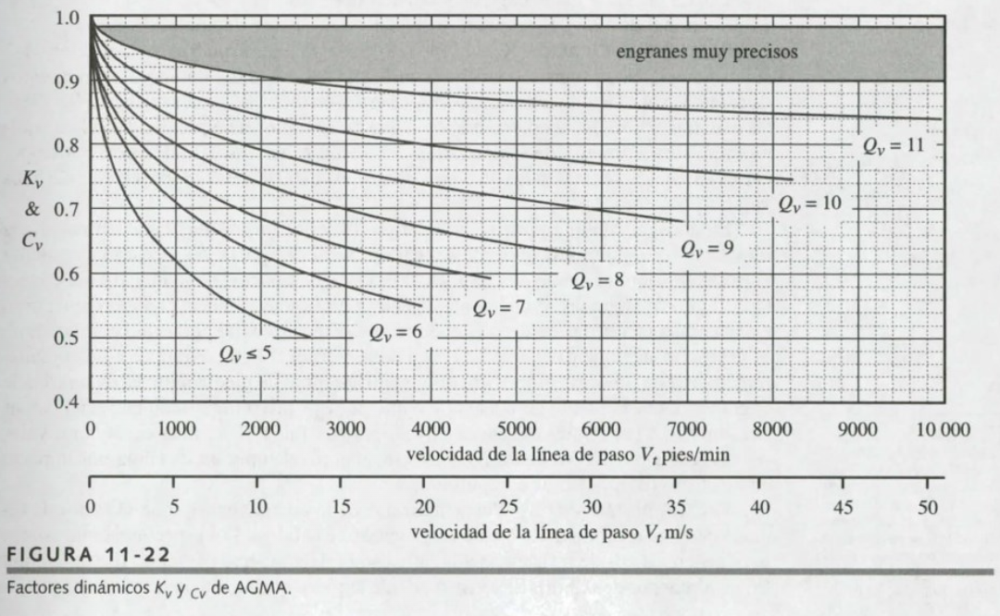

In [86]:
def k_v(quality, omega, d):
    velocity = omega * (d * 1e-3) / 2
    if quality <= 5:
        B = 1
    else:
        B =  ((12 - quality) ** (2/3))/ 4

    A = 50 + (56 * (1 - B))
    K_v = (A / (A + np.sqrt(200 * velocity))) ** (B)
    return K_v

Kv_g = k_v(quality=10, omega=208.25, d=189.82) # Factor dinámico engrane
Kv_p = k_v(quality=10, omega=261.8, d=150.99) # Factor dinámico piñón

print(f"Factor dinámico engrane: {Kv_g:.2f}")
print(f"Factor dinámico piñón: {Kv_p:.2f}")

Factor dinámico engrane: 0.80
Factor dinámico piñón: 0.80


#### $K_s$: Factor de tamaño

Depende del **módulo transversal**

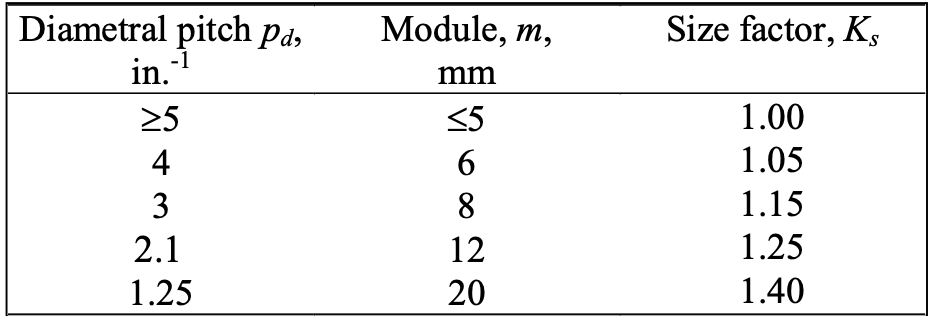
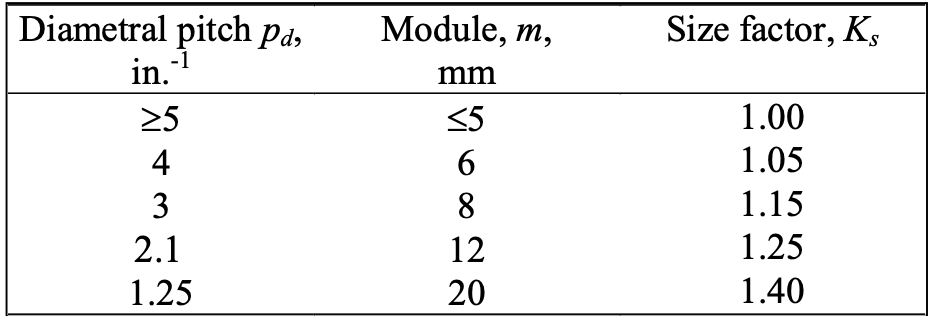

In [87]:
def k_s(m):
    if m <= 5:
        return 1
    if m == 6:
        return 1.05
    if m == 8:
        return 1.15
    if m == 12:
        return 1.25
    elif m == 20:
        return 1.40
    
Ks_g = 1 # Factor de tamaño engrane (mt = 3.46 mm)
Ks_p = 1 # Factor de tamaño piñón (mt = 3.46 mm)

#### $K_B$: Factor de espesor del aro

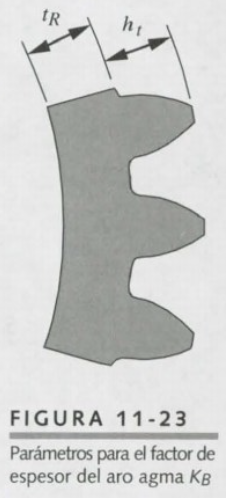
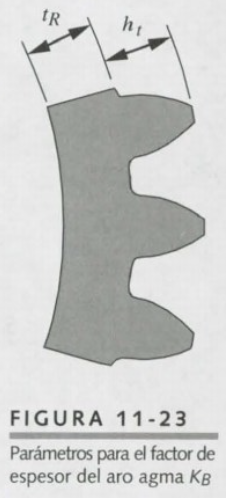

\begin{gather*}
    K_B = -2m_b + 3.4 \text{ Si } 0.5 \leq m_b \leq 1.2 \\
    K_B = 1 \text{ Si } m_b > 1.2
\end{gather*}

In [88]:
def Kb(tr, ht):
    # T_r: Espesor del aro
    # h_t: Profundidad total del diente
    m_b = tr / ht
    if 0.5 <= m_b <= 1.2:
        k_b = (-2 * m_b) + 3.4
    else:
        k_b = 1

    return k_b

Kb_g = 1 # Factor espesor de aro engrane
Kb_p = 1 # Factor espesor de aro piñón

#### $K_I$: Factor del engrane intermedio

In [89]:
def K_I(type):
    if type == "intermedio":
        return 1.42
    else:
        return 1
    
Ki_g = 1 # Factor engrane intermedio engrane
Ki_p = 1 # Factor engrane intermedio piñón

### Esfuerzo por contacto

$$ \sigma_c = C_p \sqrt{\frac{W_t}{FdI} \frac{K_a K_m}{K_v} K_s C_f}$$

Donde:

- $\sigma_c$: Esfuerzo por contacto
- $C_p$: Coeficiente elástico
- $W_t$: Fuerza tangencial transimitda
- $F$: Ancho de la cara del diente
- $d$: Diámetro de paso
- $I$: Factor geométrico de contacto
- $K_a$: Factor de aplicación
- $K_m$: Factor de distribución de carga
- $K_v$: Factor dinámico
- $K_s$: Factor de tamaño
- $C_f$: Factor de acabado superficial

In [90]:
def sigma_contacto(Cp, Wt, F, d, I, Ka, Km, Kv, Ks, Cf):

    return Cp * np.sqrt( (Wt / (F * d * I)) * (Ka * Km / Kv) * (Ks * Cf) )


#### $C_p$: Coeficiente elástico

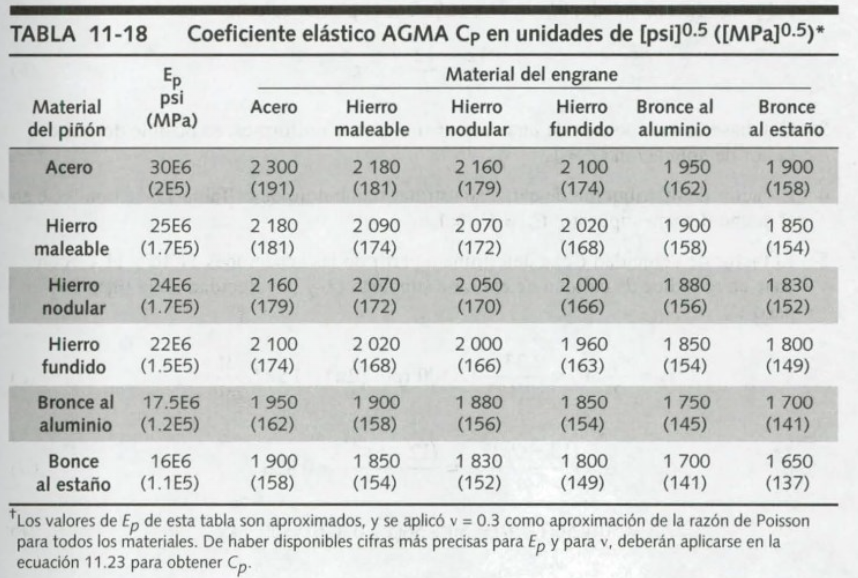
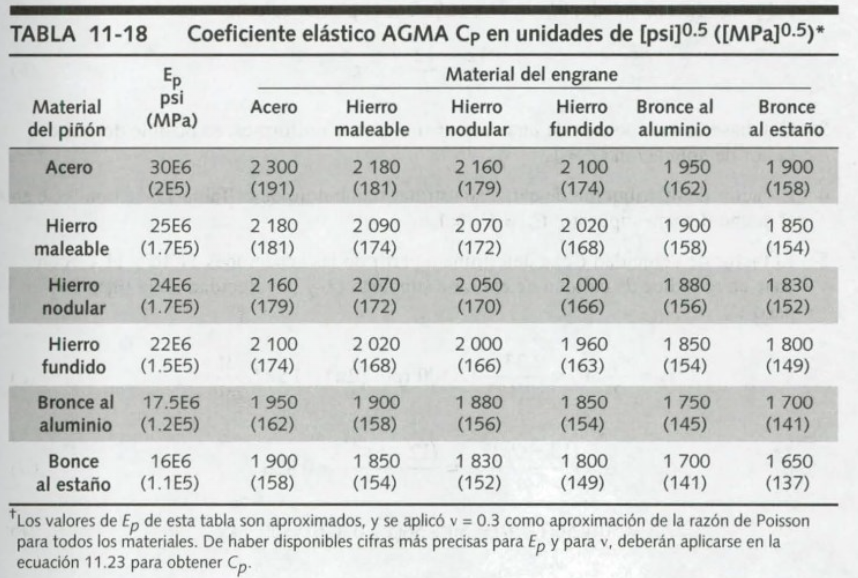

In [91]:
Cp_g = 191 # Coeficiente elástico engrane
Cp_p = 191 # Coeficiente elástico piñón

#### $I$: Factor geométrico de contacto

Cambia en engranes helicoidales

$$ 
I = \frac{\cos \psi}{(\frac{1}{\rho_g} + \frac{1}{\rho_p})d}
$$

Considerando $m_N$ = 1. Donde:
- $\rho_p = \sqrt{ 0.5 [(r_p + a_p) + C - (r_g + a_g)]^2 - (r_p \cos \phi)^2}$
- $\rho_g = C\sin - \rho_p$

In [92]:
def factor_geometrico_contacto(d_g, d_p, a_g, a_p, psi, phi):
    r_g = d_g / 2
    r_p = d_p / 2

    rho_p = np.sqrt(\
         ((0.5 * (((r_p + a_p) + (r_g + r_p) - (r_g + a_g)))) ** 2) - ((r_p * np.cos(deg_to_rad(phi))) ** 2)\
            )
    
    rho_g = ((r_p + r_g) * np.sin(deg_to_rad(phi))) - rho_p

    return np.cos(deg_to_rad(psi)) / (((1 / rho_p) + (1 / rho_g)) * d_p)
    

I_g = factor_geometrico_contacto(d_g=189.82, d_p=150.99, a_g=4, a_p=4, psi=22, phi=20)
I_p = I_g

print(f"Factor geométrico de contacto: {I_g:.2f}")

Factor geométrico de contacto: 0.09


#### $C_F$ Factor de acabado superficial

In [93]:
Cf_g = 1 # Factor acabado superficial engrane
Cf_p = 1 # Factor acabado superficial piñón

### Resistencia a la fatiga por flexión

$$ S_f = S_f' \frac{K_L}{K_T K_R}$$

- $S_f´$: Resistencia a la fatiga por flexión sin corregir
- $K_L$: Factor de vida por flexión
- $K_T$: Factor de temperatura
- $K_R$: Factor de confiabilidad

In [94]:
def resistencia_flexion(Sf_prima, Kl, Kt, Kr):
    return Sf_prima * (Kl / (Kt * Kr))

#### $S_f'$ : Resistencia a la fatiga por flexión

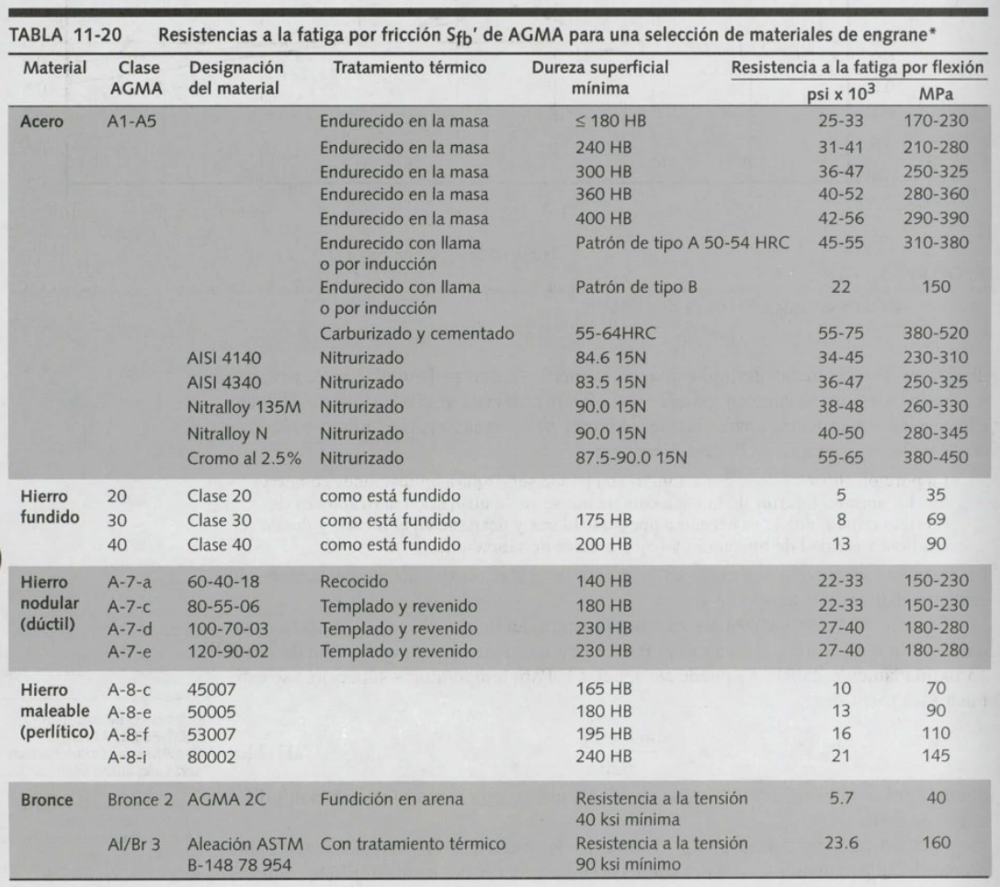 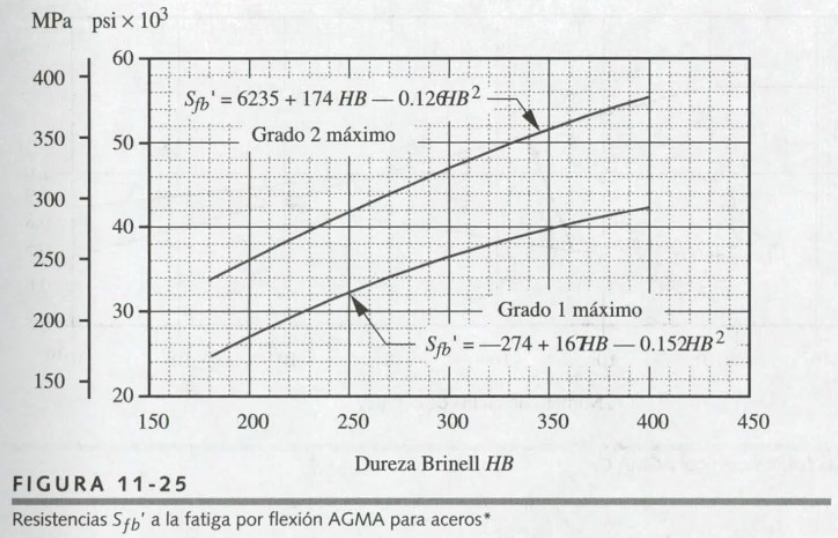

In [95]:
SF_prima_g = psi_a_mpa(6235 + (174 * 400) - (0.126 * (400 ** 2))) # Resistencia a la flexión enrgrane (sin corregir)
SF_prima_p = psi_a_mpa(6235 + (174 * 400) - (0.126 * (400 ** 2)))   # Resistencia a la flexión piñón (sin corrregir)
print(f"Resistencia a la flexión sin corregir: {SF_prima_g:.2f}")

Resistencia a la flexión sin corregir: 383.87


#### $K_L$: Factor de vida

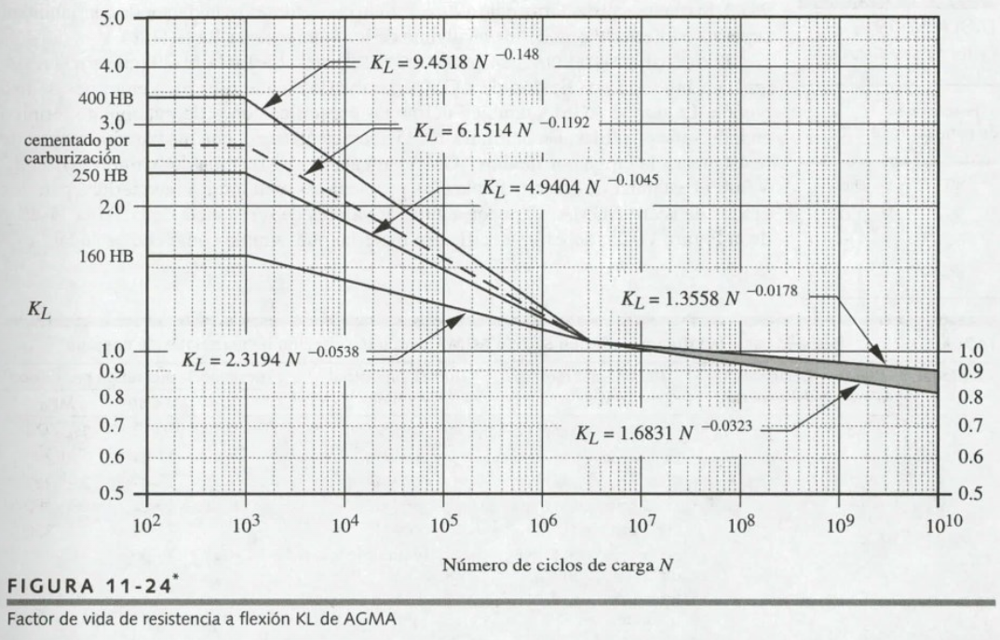

En el ejemplo en clases usan la tabla de arriba

In [96]:
KL_g = 1.6831 * ( (496.36 * 1e6) ** (-0.0323))  # Factor de viva engrane
KL_p = 1.6831 * ( (624 * 1e6) ** (-0.0323)) # Factor de vida piñón

# KL_g = 1.6831 * ( (249.6 * 1e6) ** (-0.0323))  # Factor de viva engrane
# KL_p = 1.6831 * ( (624 * 1e6) ** (-0.0323)) # Factor de vida piñón

print(f"Factor de vida engrane: {KL_g:.2f}")
print(f"Factor de vida piñón: {KL_p:.2f}")

Factor de vida engrane: 0.88
Factor de vida piñón: 0.88


#### $K_T$: Factor de temperatura

\begin{array}{ll}
      K_T = 1 \; \text{Si } T_F \leq 110 \; \text{°C} \\
      K_T = \frac{220 + T_F}{330} \; \text{Si } T_F \leq 110 \; \text{°C}
\end{array} 

In [97]:
def Kt(T):
    if T < 110:
        kt = 1
    else:
        kt = (220 + T) / 330
        
    return kt

Kt_g = Kt(60) # Factor de temperatura engrane
Kt_p = Kt(60) # Factor de tempratura piñón

print(f"Factor de temperatura engrane: {Kt_g:.2f}")
print(f"Factor de temperatura piñón: {Kt_p:.2f}")

Factor de temperatura engrane: 1.00
Factor de temperatura piñón: 1.00


#### $K_R$: Factor de confiabilidad

\begin{array}{ll}
      K_R = 0.7 - 0.15 \log(1-R) \; \text{Si } 0.9 \leq R \leq 0.99\\
      K_R = 0.5 - 0.25 \log(1-R) \; \text{Si } 0.99 \leq R \leq 0.9999
\end{array} 

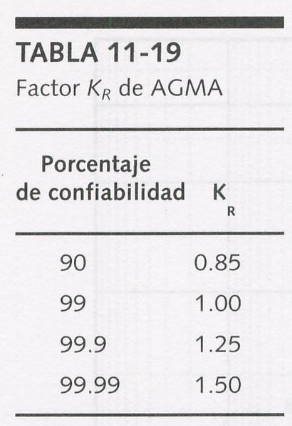

In [98]:
Kr_g = 1 # Factor confiabilidad engrane
Kr_p = 1 # Factor confiabilidad piñón

### Resistencia a la fatiga superficial

$$ S_{fc} = S_{fc}' \frac{C_L C_H}{K_T K_R}$$

- $S_{fc}'$: Resistencia a la fatiga superficial sin corregir
- $C_L$:Factor de vida superficial
- $C_H$: Factor de relación de dureza

In [99]:
def resistencia_superficial(Sfc_prima, Cl, Ch, Kt, Kr):
    return Sfc_prima * (Cl * Ch / (Kt * Kr))

#### $S_{fc}'$ : Resistencia a la fatiga superficial sin corregir

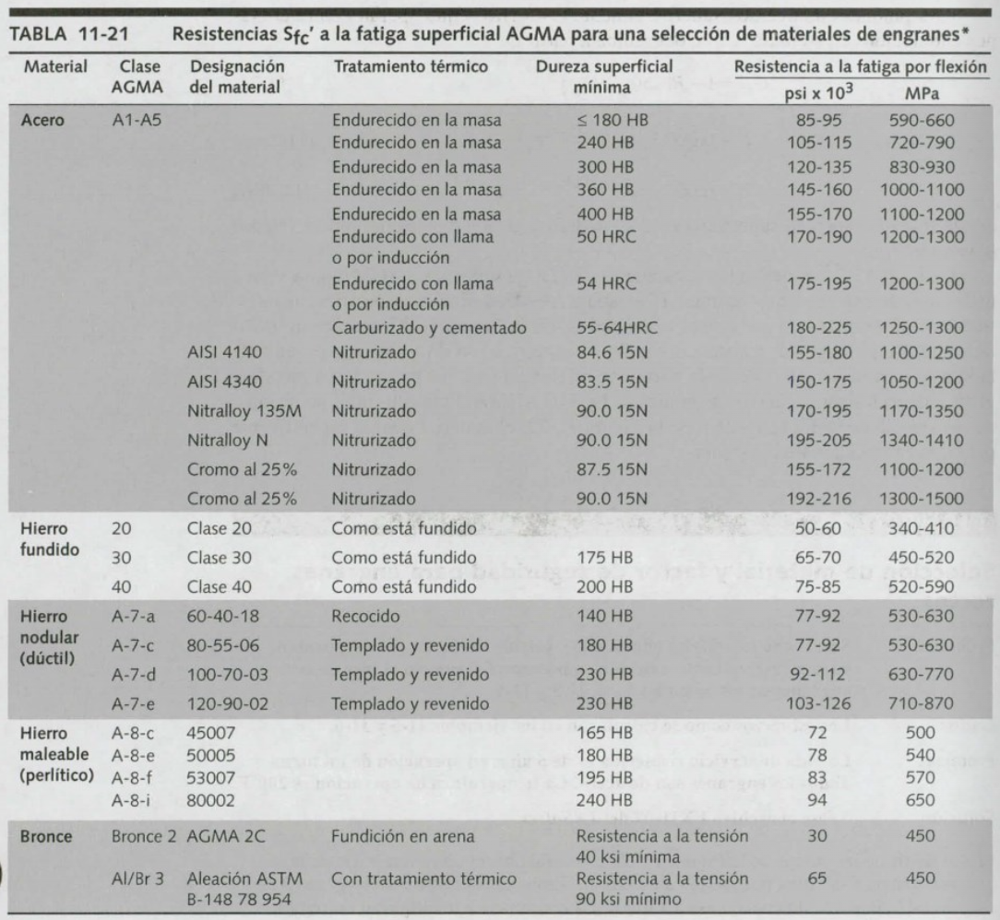 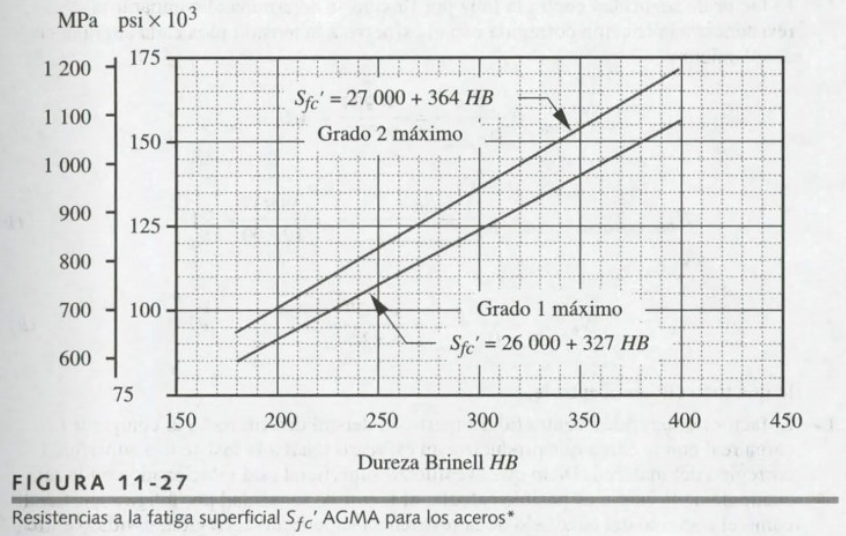

In [100]:
Sfc_prima_g = psi_a_mpa(27000 + (364 * 400)) # Resistencia al contacto engrane (sin corregir)
Sfc_prima_p = psi_a_mpa(27000 + (364 * 400)) # Resistencia al contacto piñón (sin corregir)
print(f"Resistencia al contacto sin corregir: {Sfc_prima_g:.2f}")

Resistencia al contacto sin corregir: 1190.04


#### $C_L$: Factor de vida superficial

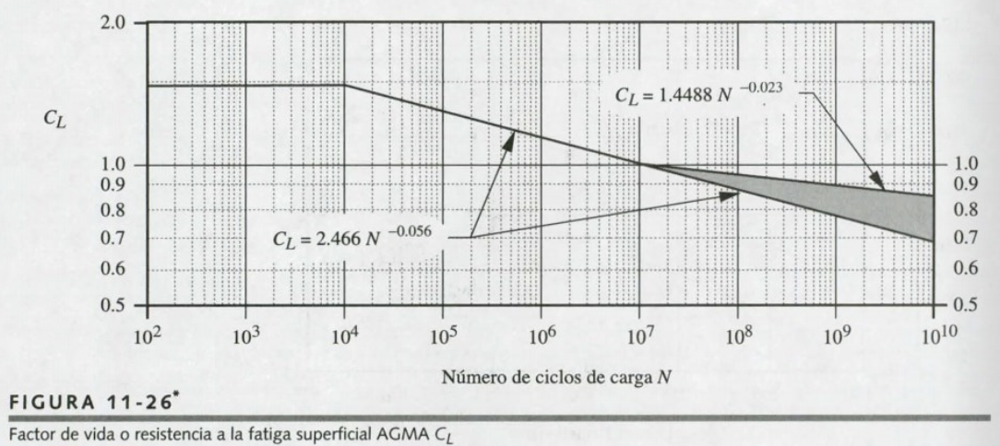

En el ejemplo en clases usan la recta de arriba

In [101]:
CL_g = 2.466 * ( (496.36 * 1e6) ** (-0.056)) # Factor vida engrane
CL_p = 2.466 * ( (624 * 1e6) ** (-0.056)) # Factor vida piñón

# CL_g = 1.4488 * ( (249.6 * 1e6) ** (-0.023)) # Factor vida engrane
# CL_p = 1.4488 * ( (624 * 1e6) ** (-0.023)) # Factor vida piñón

print(f"Factor de vida engrane: {CL_g:.2f}")
print(f"Factor de vida piñón: {CL_p:.2f}")

Factor de vida engrane: 0.80
Factor de vida piñón: 0.79


#### $C_H$: Factor de relación de dureza

In [102]:
CH_g = 1 # Factor dureza engrane
CH_p = 1 # Factor dureza piñón

# Código de cálculo automático

In [103]:
class ParHelicoidales:

    def __init__(self, m_n, N_p, N_g, H, phi, psi, t, omega_g, omega_p, F):
        """
        Recibe:
        m_n: Módulo normal (mm)
        N_p: Número de dientes del piñón
        N_p: Número de dientes del piñón
        H: Potencia que deseo transmitir (W)
        phi: Ángulo de presión transversal (grados)
        psi: Ángulo de la hélice
        t: Tiempo de operación (horas)
        omega_g: Velocidad angular del engrane (rad/s)
        omega_p: Velocidad angular del piñón (rad/s)
        F: Ancho de cara en mm
        """

        # ------------------------------ Geometría ------------------------------------
        self.m_n = m_n # módulo normal
        self.N_p = N_p # Dientes piñón
        self.N_g = N_g # Dientes engrane
        self.H = H # Potencia
        self.phi = (phi) # Ángulo de presión transversal
        self.psi = psi # Ángulo de la hélice
        self.t = t * 60 # Tiempo en minutos
        self.omega_g = omega_g # Velocidad del engrane en rad/s
        self.omega_p = omega_p # Velocidad del piñón en rad/s
        self.n_g = radps_to_rpm(self.omega_g) # Velocidad del engrane en rpm
        self.n_p = radps_to_rpm(self.omega_p) # Velocidad del piñón en rpm
        self.F = F # Ancho de cara en mm

        # Obtención de los valores a partir de phi_t, m_n, psi

        # Módulo transversal
        self.m_t = self.m_n / np.cos(deg_to_rad(self.psi))

        # Diámetros de paso en mm
        self.d_g = diametro_paso(self.N_g, self.m_n, self.psi)
        self.d_p = diametro_paso(self.N_p, self.m_n, self.psi)

        # Addendum y deddendum
        self.a_g, self.b_g = parametros_modulo_normal(self.m_n) # Addendum y deddendum del engranaje
        self.a_p, self.b_p = parametros_modulo_normal(self.m_n) # Addendum y deddendum del piñón

        # Pasos axiales
        self.px_g = paso_axial(p_n = 1 / mm_to_inch(m_n), psi=self.psi)
        self.px_p = paso_axial(p_n = 1 / mm_to_inch(m_n), psi=self.psi)

        # Pasos transversales
        self.pt_g = paso_transversal(p_n = 1 / (mm_to_inch(m_n)), psi=self.psi)
        self.pt_p = paso_transversal(p_n = 1 / (mm_to_inch(m_n)), psi=self.psi)

        # Diámetros base
        self.db_g = diametro_base(self.d_g, self.phi)
        self.db_p = diametro_base(self.d_p, self.phi)

        # Razones de contacto axial
        self.mf_g = razon_contacto_axial(mm_to_inch(self.F), self.px_g)
        self.mf_p = razon_contacto_axial(mm_to_inch(self.F), self.px_p)

        # Longitud de acción
        self.Z = longitud_accion(self.d_g / 2, self.a_g, self.d_p / 2, self.a_p, self.phi) # mm

        # Razón de contacto transversal
        self.mp_g = razon_contacto_transversal(Z=mm_to_inch(self.Z), p_t=self.pt_g, psi=psi)
        self.mp_p = razon_contacto_transversal(Z=mm_to_inch(self.Z), p_t=self.pt_p, psi=psi)

        # Chequear interferencia
        self.interferencia_g = chequear_interferencia(self.d_g, self.db_g, self.m_n)
        self.interferencia_p = chequear_interferencia(self.d_p, self.db_p, self.m_n)

        # Chequear razones de contacto
        self.razon_contacto_g = chequear_razon_contacto(self.mf_g, self.mp_g)
        self.razon_contacto_p = chequear_razon_contacto(self.mf_p, self.mp_g)


        # ----------------------- Análisis de fuerzas -----------------------------

        self.T_p = self.H / self.omega_p # Torque piñón
        self.T_g = self.H / self.omega_g # Torque engrane

        self.Wt_p = fuerza_tangencial(self.T_p, self.d_p) # Fuerza tangencial piñón
        self.Wt_g = fuerza_tangencial(self.T_g, self.d_g) # Fuerza tangencial engrane

        self.N_ciclos_p = self.n_p * self.t # Número de ciclos piñón
        self.N_ciclos_g = self.n_g * self.t # Número de ciclos engrane

        self.distancia_entre_centros = (self.d_g + self.d_p) / 2

        # self.mostrar_resultados_geométricos()

    def esfuerzo_flexion_engrane(self, J, Ka, Km, Kv, Ks, Kb, Ki):
        """
        Recibe:
        J: Factor de forma
        F: Ancho de cara (mm)
        Ka: Factor de carga aplicada
        Km: Factor de carga dinámica
        Kv: Factor de velocidad
        Ks: Factor de tamaño
        Kb: Factor de borde
        Ki: Factor de idoneidad

        Qué calcula:
        El esfuerzo a flexión en el engranaje
        """
        self.sigma_f_g = sigma_flexion(self.Wt_g, self.F, self.m_t, J, Ka, Km, Kv, Ks, Kb, Ki)

    def esfuerzo_flexion_pinon(self, J, Ka, Km, Kv, Ks, Kb, Ki):
        """
        Recibe:
        J: Factor de forma
        F: Ancho de cara (mm)
        Ka: Factor de carga aplicada
        Km: Factor de carga dinámica
        Kv: Factor de velocidad
        Ks: Factor de tamaño
        Kb: Factor de borde
        Ki: Factor de engrane intermedio

        Qué calcula:
        El esfuerzo a flexión en el piñón
        """
        self.sigma_f_p = sigma_flexion(self.Wt_p, self.F, self.m_t, J, Ka, Km, Kv, Ks, Kb, Ki)
        
    def esfuerzo_contacto_engrane(self, Cp, I, Ka, Km, Kv, Ks, Cf):
        """
        Recibe:
        Cp: Coeficiente elástico del material
        F: Ancho de cara (mm)
        I: Factor geométrico de contacto
        Km: Factor de carga dinámica
        Kv: Factor de velocidad
        Ks: Factor de tamaño
        Cf: Factor de acabado superficial
        Ki: Factor de idoneidad

        Qué calcula:
        El esfuerzo a flexión en el piñón
        """
        self.sigma_c_g = sigma_contacto(Cp, self.Wt_g, self.F, self.d_g, I, Ka, Km, Kv, Ks, Cf)

    def esfuerzo_contacto_pinon(self, Cp, I, Ka, Km, Kv, Ks, Cf):
        """
        Recibe:
        Cp: Coeficiente elástico del material
        F: Ancho de cara (mm)
        I: Factor geométrico de contacto
        Km: Factor de carga dinámica
        Kv: Factor de velocidad
        Ks: Factor de tamaño
        Cf: Factor de acabado superficial
        Ki: Factor de idoneidad

        Qué calcula:
        El esfuerzo a flexión en el piñón
        """
        self.sigma_c_p = sigma_contacto(Cp, self.Wt_p, self.F, self.d_p, I, Ka, Km, Kv, Ks, Cf)
    
    def resistencia_flexion_engrane(self, Sf_prima, Kl, Kt, Kr):
        """ 
        Recibe:
        Sf_prima: Resistencia a la fatiga por flexión sin corregir
        Kl: Factor de vida por flexión
        Kt: Factor de temperatura
        Kr: Factor de confiabilidad:

        Retorna:
        S_fc: Resistencia a la fatiga por flexión corregida
        """
        self.S_f_g = resistencia_flexion(Sf_prima, Kl, Kt, Kr)

    def resistencia_superficial_engrane(self, Sfc_prima, Cl, Ch, Kt, Kr):
        """ 
        Recibe:
        Sf_prima: Resistencia a la fatiga por contacto sin corregir
        Cl: Factor de vida por contacto
        Ch: Factor de dureza
        Kt: Factor de temperatura
        Kr: Factor de confiabilidad:

        Retorna:
        S_fc: Resistencia a la fatiga por flexión corregida
        """
        self.S_fc_g = resistencia_superficial(Sfc_prima, Cl, Ch, Kt, Kr)

    def resistencia_flexion_pinon(self, Sf_prima, Kl, Kt, Kr):
        """ 
        Recibe:
        Sf_prima: Resistencia a la fatiga por flexión sin corregir
        Kl: Factor de vida por flexión
        Kt: Factor de temperatura
        Kr: Factor de confiabilidad:

        Retorna:
        S_fc: Resistencia a la fatiga por flexión corregida
        """
        self.S_f_p = resistencia_flexion(Sf_prima, Kl, Kt, Kr)

    def resistencia_superficial_pinon(self, Sfc_prima, Cl, Ch, Kt, Kr):
        """ 
        Recibe:
        Sf_prima: Resistencia a la fatiga por contacto sin corregir
        Cl: Factor de vida por contacto
        Ch: Factor de dureza
        Kt: Factor de temperatura
        Kr: Factor de confiabilidad:

        Retorna:
        S_fc: Resistencia a la fatiga por flexión corregida
        """
        self.S_fc_p = resistencia_superficial(Sfc_prima, Cl, Ch, Kt, Kr)

    def factores_seguridad(self):
        self.factor_seguridad_flexion_engrane = self.S_f_g / self.sigma_f_g
        self.factor_seguridad_flexion_pinon = self.S_f_p / self.sigma_f_p
        self.factor_seguridad_contacto_engrane = (self.S_fc_g / self.sigma_c_g) ** 2
        self.factor_seguridad_contacto_pinon = (self.S_fc_p / self.sigma_c_p) ** 2

    def mostrar_resultados_geométricos(self):
        headers = ["Parámetro", "Engrane", "Piñón"]
        table = [
            ["Módulo normal (mm)", f"{self.m_n:.2f}", f"{self.m_n:.2f}"],
            ["Módulo transversal (mm)", f"{self.m_t:.2f}", f"{self.m_t:.2f}"],
            ["Número de dientes", f"{self.N_g:.2f}", f"{self.N_p:.2f}"],
            ["Diámetro de paso (mm)", f"{self.d_g:.2f}", f"{self.d_p:.2f}"],
            ["Addendum (mm)", f"{self.a_g:.2f}", f"{self.a_p:.2f}"],
            ["Deddendum (mm)", f"{self.b_g:.2f}", f"{self.b_p:.2f}"],
            ["Ancho de cara (mm)", f"{self.F:.2f}", f"{self.F:.2f}"],
            ["Ángulo de presión transversal", self.phi, self.phi],
            ["Ángulo de la hélice", self.psi, self.psi],
            ["Longitud de acción (mm)", f"{self.Z:.2f}", f"{self.Z:.2f}"],
            ["Velocidad (rad/s)", f"{self.omega_g:.2f}", f"{self.omega_p:.2f}"],
            ["Velocidad (rpm)", f"{self.n_g:.2f}", f"{self.n_p:.2f}"],
            ["Número de ciclos (*1e6)", f"{self.N_ciclos_g * 1e-6:.2f}", f"{self.N_ciclos_p * 1e-6:.2f}"],
            ["Torque (Nm)", f"{self.T_g:.2f}", f"{self.T_p:.2f}"],
            ["Fuerza Tangencial (N)", f"{self.Wt_g:.2f}", f"{self.Wt_p:.2f}"],
            ["Interferencia", self.interferencia_g, self.interferencia_p],
            ["Razón de contacto axial", self.razon_contacto_g, self.razon_contacto_p]
        ]

        print(tabulate(table, headers, tablefmt="simple_grid"))

    def mostrar_resultados_esfuerzos(self):

        self.factores_seguridad()

        headers = ["Parámetro", "Engrane", "Piñón"]
        table = [
            ["Esfuerzo por flexión (MPa)", f"{self.sigma_f_g:.2f}", f"{self.sigma_f_p:.2f}"],
            ["Esfuerzo por contacto (MPa)", f"{self.sigma_c_g:.2f}", f"{self.sigma_c_p:.2f}"],
            ["Resistencia a la fatiga por flexión (MPa)", f"{self.S_f_g:.2f}", f"{self.S_f_p:.2f}"],
            ["Resistencia a la fatiga por contacto (MPa)", f"{self.S_fc_p:.2f}", f"{self.S_fc_p:.2f}"],
            ["Factor de seguridad por flexión", f"{self.factor_seguridad_flexion_engrane:.3f}", f"{self.factor_seguridad_flexion_pinon:.3f}"],
            ["Factor de seguridad por contacto", f"{self.factor_seguridad_contacto_engrane:.3f}", f"{self.factor_seguridad_contacto_pinon:.3f}"],
        ]

        print(tabulate(table, headers, tablefmt="fancy_grid"))


# Iteración para el proyecto

In [104]:
modulo_1 = 4 # mm
potencia = hp_to_watt(85) # W
phi_1 = 20
Np = 35 # Número de dientes del piñón
Ng = 44 # Número de dientes del engrane
omega_p = rpm_to_radps(2500) # Velocidad del piñón
omega_g = omega_p * (Np / Ng) # Velocidad del engrane
tiempo_operacion = 4 * 5 * 52 * 4 # Tiempo en horas de operar 4 hrs, 5 dias a la semana durante 4 años
ancho_cara = 64 # mm
psi_1 = 22

par1 = ParHelicoidales(m_n=modulo_1, N_p=Np, N_g=Ng, H=potencia, phi=phi_1, psi=psi_1, t=tiempo_operacion, omega_g=omega_g, omega_p=omega_p, F=ancho_cara)

## Primer par de engranes

Acá se ingresan los parámetros para calcular los esfuerzos de los engranes

In [105]:
# --------- Esfuerzo por flexión en el engrane ----------
par1.esfuerzo_flexion_engrane(
    J=J_g,
    Ka=Ka_g,
    Km=Km_g,
    Kv=Kv_g,
    Ks=Ks_g,
    Kb=Kb_g,
    Ki=Ki_g
)

# -------- Esfuerzo por flexión en el piñón ------------
par1.esfuerzo_flexion_pinon(
    J=J_p,
    Ka=Ka_p,
    Km=Km_p,
    Kv=Kv_p,
    Ks=Ks_p,
    Kb=Kb_p,
    Ki=Ki_p
)

# -------- Esfuerzo por contacto en el engrane ----------

par1.esfuerzo_contacto_engrane(
    Cp=Cp_g,
    I=I_g,
    Ka=Ka_g,
    Km=Km_g,
    Kv=Kv_g,
    Ks=Ks_g,
    Cf=Cf_g
)
# -------- Esfuerzo por contacto en el piñón ------------
par1.esfuerzo_contacto_pinon(
    Cp=Cp_p,
    I=I_p,
    Ka=Ka_p,
    Km=Km_p,
    Kv=Kv_p,
    Ks=Ks_p,
    Cf=Cf_p
)


Acá se ingresan los parámetros para determinar las resistencias

In [106]:
# ------- Resistencia a la flexión engrane ------------
par1.resistencia_flexion_engrane(
    Sf_prima=SF_prima_g,
    Kl=KL_g,
    Kt=Kt_g,
    Kr=Kr_g
)

# ------ Resistencia a la flexión piñón -----------
par1.resistencia_flexion_pinon(
    Sf_prima=SF_prima_p,
    Kl=KL_p,
    Kt=Kt_p,
    Kr=Kr_p
)

# -------- Resistencia al contacto engrane ---------
par1.resistencia_superficial_engrane(
    Sfc_prima=Sfc_prima_g,
    Cl=CL_g,
    Ch=CH_g,
    Kt=Kt_g,
    Kr=Kr_g
)

# -------- Resistencia al contacto piñón ---------
par1.resistencia_superficial_pinon(
    Sfc_prima=Sfc_prima_p,
    Cl=CL_p,
    Ch=CH_p,
    Kt=Kt_p,
    Kr=Kr_p
)

par1.mostrar_resultados_esfuerzos()

╒════════════════════════════════════════════╤═══════════╤═════════╕
│ Parámetro                                  │   Engrane │   Piñón │
╞════════════════════════════════════════════╪═══════════╪═════════╡
│ Esfuerzo por flexión (MPa)                 │   116.35  │ 119.32  │
├────────────────────────────────────────────┼───────────┼─────────┤
│ Esfuerzo por contacto (MPa)                │   782.81  │ 877.71  │
├────────────────────────────────────────────┼───────────┼─────────┤
│ Resistencia a la fatiga por flexión (MPa)  │   338.39  │ 335.9   │
├────────────────────────────────────────────┼───────────┼─────────┤
│ Resistencia a la fatiga por contacto (MPa) │   944.11  │ 944.11  │
├────────────────────────────────────────────┼───────────┼─────────┤
│ Factor de seguridad por flexión            │     2.908 │   2.815 │
├────────────────────────────────────────────┼───────────┼─────────┤
│ Factor de seguridad por contacto           │     1.492 │   1.157 │
╘═════════════════════════════════

In [107]:
combinaciones = []

for b in range(1, 201):  # b desde 1 hasta 200
    a = int(2.5 * b)
    if a <= 200 and a == 2.5 * b:  # asegurar que es entero y <=200
        combinaciones.append((a, b))

# Mostrar resultados
print("Combinaciones que cumplen con la razón 2.5:1 entre 0 y 200:")
for a, b in combinaciones:
    print(f"({a}, {b})")

    

Combinaciones que cumplen con la razón 2.5:1 entre 0 y 200:
(5, 2)
(10, 4)
(15, 6)
(20, 8)
(25, 10)
(30, 12)
(35, 14)
(40, 16)
(45, 18)
(50, 20)
(55, 22)
(60, 24)
(65, 26)
(70, 28)
(75, 30)
(80, 32)
(85, 34)
(90, 36)
(95, 38)
(100, 40)
(105, 42)
(110, 44)
(115, 46)
(120, 48)
(125, 50)
(130, 52)
(135, 54)
(140, 56)
(145, 58)
(150, 60)
(155, 62)
(160, 64)
(165, 66)
(170, 68)
(175, 70)
(180, 72)
(185, 74)
(190, 76)
(195, 78)
(200, 80)


In [108]:
def combinaciones_relacion(razon_de_dientes):
    """Muestra todas las combinaciones para razón de 
    dientes para un número de dientes menor a 200"""
    combinaciones = []

    for b in range(1, 201):  # b desde 1 hasta 200
        a = int(razon_de_dientes * b)
        if a <= 200 and a == razon_de_dientes * b:  # asegurar que es entero y <=200
            combinaciones.append((a, b))

    return combinaciones

modulo_1 = 2 # mm
potencia = hp_to_watt(85) # W
phi_1 = 20
omega_p = rpm_to_radps(2500) # Velocidad del piñón
omega_g = omega_p * (Np / Ng) # Velocidad del engrane
tiempo_operacion = 4 * 5 * 52 * 4 # Tiempo en horas de operar 4 hrs, 5 dias a la semana durante 4 años
ancho_cara = 50 # mm
psi_1 = 30

combinaciones_2_1 = combinaciones_relacion(2)
combinaciones_25_10 = combinaciones_relacion(2.5)

for j in range(len(combinaciones_2_1)):

    dientes_engrane = combinaciones_2_1[j][0]
    dientes_pinon = combinaciones_2_1[j][1]

    velocidad_pinon = rpm_to_radps(2500)
    velocidad_engrane = velocidad_pinon * dientes_pinon / dientes_engrane

    par_razon_2 = ParHelicoidales(m_n=modulo_1, N_p=dientes_pinon, N_g=dientes_engrane, H=potencia, phi=phi_1, psi=psi_1, t=tiempo_operacion, omega_g=velocidad_engrane, omega_p=velocidad_pinon, F=ancho_cara)
    
    for i in range(len(combinaciones_25_10)):

        dientes_engrane_25 = combinaciones_25_10[i][0]
        dientes_pinon_10 = combinaciones_25_10[i][1]

        velocidad_pinon_10 = rpm_to_radps(2500)
        velocidad_engrane_25 = velocidad_pinon_10 * dientes_pinon_10 / dientes_engrane_25

        par_razon_25 = ParHelicoidales(m_n=modulo_1, N_p=dientes_pinon_10, N_g=dientes_engrane_25, H=potencia, phi=phi_1, psi=psi_1, t=tiempo_operacion, omega_g=velocidad_engrane_25, omega_p=velocidad_pinon_10, F=ancho_cara)

        if np.abs(par_razon_2.distancia_entre_centros - par_razon_25.distancia_entre_centros) < 0.01 \
            and (par_razon_2.interferencia_g == "No hay interferencia ✅" and par_razon_2.interferencia_p == "No hay interferencia ✅") \
                and (par_razon_25.interferencia_g == "No hay interferencia ✅" and par_razon_25.interferencia_p == "No hay interferencia ✅"):
            print(f"\nPosible combinación de dientes que comparten distancia entre centros")

            print(f"2:1: N_p = {par_razon_2.N_p:.2f}, Ng = {par_razon_2.N_g:.2f}, C = {par_razon_2.distancia_entre_centros:.2f}")
            print(f"2.5:1: N_p = {par_razon_25.N_p:.2f}, Ng = {par_razon_25.N_g:.2f}, C = {par_razon_25.distancia_entre_centros:.2f}")



Posible combinación de dientes que comparten distancia entre centros
2:1: N_p = 35.00, Ng = 70.00, C = 121.24
2.5:1: N_p = 30.00, Ng = 75.00, C = 121.24

Posible combinación de dientes que comparten distancia entre centros
2:1: N_p = 42.00, Ng = 84.00, C = 145.49
2.5:1: N_p = 36.00, Ng = 90.00, C = 145.49

Posible combinación de dientes que comparten distancia entre centros
2:1: N_p = 49.00, Ng = 98.00, C = 169.74
2.5:1: N_p = 42.00, Ng = 105.00, C = 169.74

Posible combinación de dientes que comparten distancia entre centros
2:1: N_p = 56.00, Ng = 112.00, C = 193.99
2.5:1: N_p = 48.00, Ng = 120.00, C = 193.99

Posible combinación de dientes que comparten distancia entre centros
2:1: N_p = 63.00, Ng = 126.00, C = 218.24
2.5:1: N_p = 54.00, Ng = 135.00, C = 218.24

Posible combinación de dientes que comparten distancia entre centros
2:1: N_p = 70.00, Ng = 140.00, C = 242.49
2.5:1: N_p = 60.00, Ng = 150.00, C = 242.49

Posible combinación de dientes que comparten distancia entre centros